# Issue with forward integration with LMC

Following the `galpy` documentation example, [Including the Milky Way center’s barycentric acceleration due to the Large Magellanic Cloud in orbit integrations](https://docs.galpy.org/en/v1.8.1/orbit.html#new-in-v1-8-example-including-the-milky-way-center-s-barycentric-acceleration-due-to-the-large-magellanic-cloud-in-orbit-integrations), we are able to produce a backwards orbit for Bootes III. However, when we switch to forward integration, the orbit becomes unbound when including the LMC into the potential. There should be consistency in the timescale, as we are making a moving LMC potential with a forward timescale for the forward integration of other orbits. However, the resulting orbit still goes unbound.

We are keeping default settings on the MWPotential2014 model, that is, distance and velocity scales are `ro = 8` kpc and `vo = 220` km/s.

This notebook runs through orbit integration for Milky Way satellites and globular clusters. We are only considering the MWPotential2014 here.

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from astropy import units
from plot_functions import *
plt.rcParams.update(params)

from galpy.orbit import Orbit
from galpy import potential
from galpy.util import conversion
from galpy.potential import MWPotential2014, ChandrasekharDynamicalFrictionForce, HernquistPotential, \
                            MovingObjectPotential, evaluateRforces, evaluatephitorques, evaluatezforces, \
                            NonInertialFrameForce
from galpy.potential.mwpotentials import McMillan17
from galpy.df import streamspraydf

## Setting up potential
Here we make a function to hold all the code needed to generate the Milky Way potential including its reflex motion. This ensures we don't mix up variables for creating forward moving LMC and backward moving LMC.

In [3]:
def get_MWPotential2014_with_LMC(timescale):
    """Return the total potential to be used in orbit integration.
    
    This function is just the code from the galpy documentation example, with
    the addition of ro and vo for flexibility when choosing different potentials.
    (The same link referenced in the header of this notebook)
    
    Parameter:
    ----------
    timescale : the time array as astropy Quantity.
    """
    # Define orbit
    o = Orbit.from_name('LMC')

    # Define dynamical friction force
    cdf = ChandrasekharDynamicalFrictionForce(GMs=10.**11.*units.Msun, rhm=5.*units.kpc, dens=MWPotential2014)

    # Integrate the LMC orbit
    o.integrate(timescale, MWPotential2014+cdf)

    # Set it as moving object potential
    lmcpot = HernquistPotential(amp=2*10.**11.*units.Msun, a=5.*units.kpc/(1.+np.sqrt(2.)))
    moving_lmcpot = MovingObjectPotential(o, pot=lmcpot)

    # Acceleration at origin
    loc_origin= 1e-4 # Small offset in R to avoid numerical issues
    ax = lambda t : evaluateRforces(moving_lmcpot, loc_origin, 0., phi=0., t=t, use_physical=False)
    ay = lambda t : evaluatephitorques(moving_lmcpot, loc_origin, 0., phi=0., t=t, use_physical=False) / loc_origin
    az = lambda t : evaluatezforces(moving_lmcpot, loc_origin, 0., phi=0., t=t, use_physical=False)

    # Use interpolation function to speed things up
    t_intunits= o.time(use_physical=False)[::-1] # need to reverse the order for interp
    ax4int = np.array([ax(t) for t in t_intunits])
    ax_int = lambda t : np.interp(t, t_intunits, ax4int)
    ay4int = np.array([ay(t) for t in t_intunits])
    ay_int = lambda t : np.interp(t, t_intunits, ay4int)
    az4int = np.array([az(t) for t in t_intunits])
    az_int = lambda t : np.interp(t, t_intunits, az4int)

    nip = NonInertialFrameForce(a0=[ax_int, ay_int, az_int])
    
    return MWPotential2014 + nip + moving_lmcpot, o

In [4]:
timescale1 = np.linspace(0., -10., 1001)*units.Gyr   # Backward
timescale2 = np.linspace(0., 10., 1001)*units.Gyr    # Forward

In [5]:
potential_backward, orbit_lmc_backward = get_MWPotential2014_with_LMC(timescale1)
potential_forward, orbit_lmc_forward = get_MWPotential2014_with_LMC(timescale2)

## Integration

In [6]:
time_backward = np.linspace(0., -5., 1001)*units.Gyr
time_forward = np.linspace(0., 5., 1001)*units.Gyr

In [7]:
def integrate_orbits_from_name(orbit_name):
    """
    MWPotential2014 only.
    """
    # Integration, no LMC
    orbit_backward_no_LMC = Orbit.from_name(orbit_name)
    orbit_backward_no_LMC.integrate(time_backward, MWPotential2014)

    orbit_forward_no_LMC = Orbit.from_name(orbit_name)
    orbit_forward_no_LMC.integrate(time_forward, MWPotential2014)
    
    # Integration, with LMC
    orbit_backward = Orbit.from_name(orbit_name)
    orbit_backward.integrate(time_backward, potential_backward)

    orbit_forward = Orbit.from_name(orbit_name)
    orbit_forward.integrate(time_forward, potential_forward)

    # Plot
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    
    ax[0].plot(orbit_backward_no_LMC.y(time_backward), orbit_backward_no_LMC.z(time_backward), c='k', ls='--', label='Back 5 Gyrs')
    ax[0].plot(orbit_forward_no_LMC.y(time_forward), orbit_forward_no_LMC.z(time_forward), c='k', label='Forward 5 Gyrs')
    ax[0].set_xlim(-100, 100)
    ax[0].set_ylim(-100, 100)
    ax[0].set_title(name+' no LMC')
    ax[0].legend()

    ax[1].plot(orbit_backward.y(time_backward), orbit_backward.z(time_backward), c='k', ls='--', label='Back 5 Gyrs', alpha=0.2)
    ax[1].plot(orbit_forward.y(time_forward), orbit_forward.z(time_forward), c='k', label='Forward 5 Gyrs', alpha=0.2)
    ax[1].plot(orbit_backward.y(time_backward[:len(time_backward)//2]), orbit_backward.z(time_backward[:len(time_backward)//2]), c='k', ls='--')
    ax[1].plot(orbit_forward.y(time_forward[:len(time_forward)//2]), orbit_forward.z(time_forward[:len(time_forward)//2]), c='k')
    
    ax[1].plot(orbit_lmc_backward.y(time_backward), orbit_lmc_backward.z(time_backward), c='deepskyblue', ls='--', label='LMC backward', alpha=0.2)
    ax[1].plot(orbit_lmc_forward.y(time_forward), orbit_lmc_forward.z(time_forward), c='deepskyblue', label='LMC forward', alpha=0.2)
    ax[1].plot(orbit_lmc_backward.y(time_backward[:len(time_backward)//2]), orbit_lmc_backward.z(time_backward[:len(time_backward)//2]), c='deepskyblue', ls='--')
    ax[1].plot(orbit_lmc_forward.y(time_forward[:len(time_forward)//2]), orbit_lmc_forward.z(time_forward[:len(time_forward)//2]), c='deepskyblue')
    ax[1].set_xlim(-100, 100)
    ax[1].set_ylim(-100, 100)
    ax[1].set_title(name+' with LMC')
    ax[1].legend()

In [8]:
osatellites = Orbit.from_name("MWsatellitegalaxies")
names = osatellites.name

oclusters = Orbit.from_name('MWglobularclusters')
cluster_names = oclusters.name

There is LMC in the MW satellites. Not plotting it below.

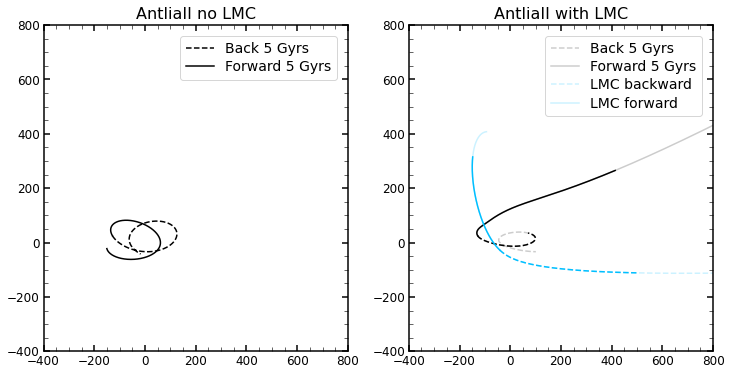

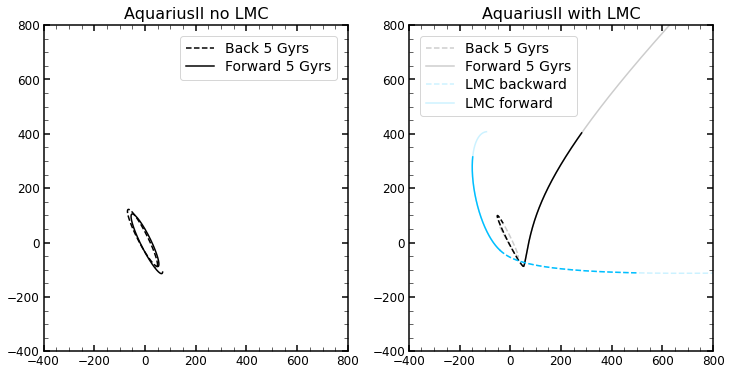

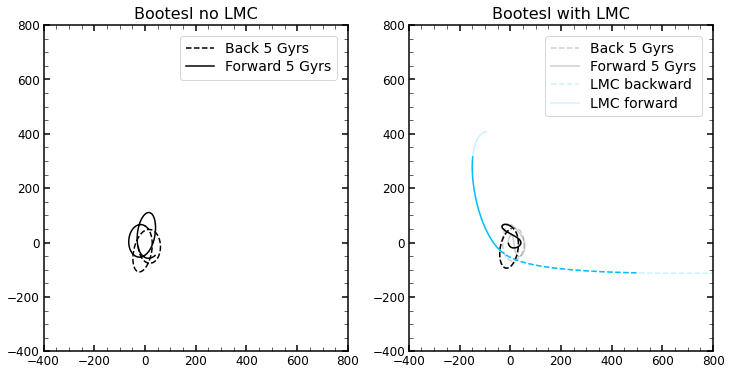

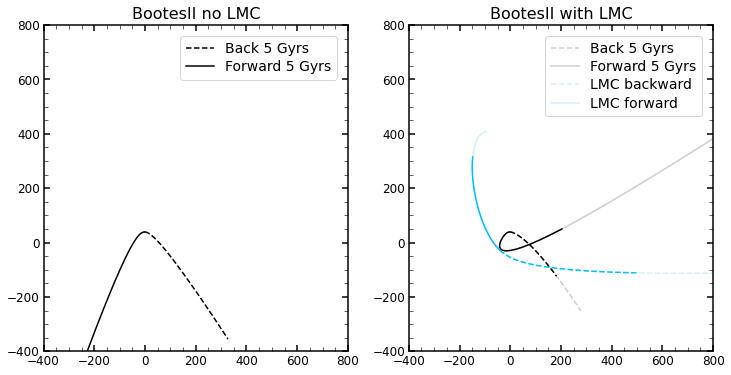

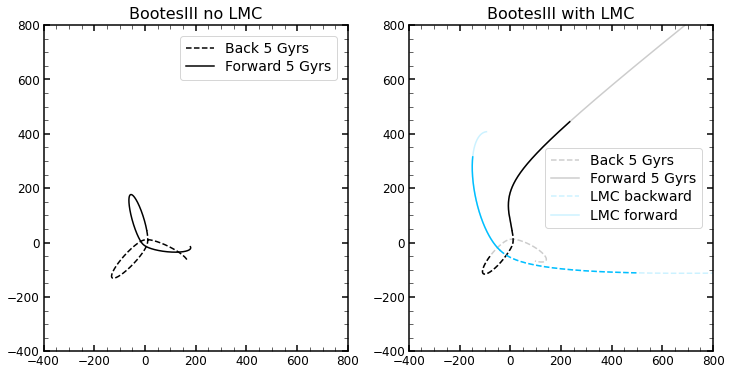

...

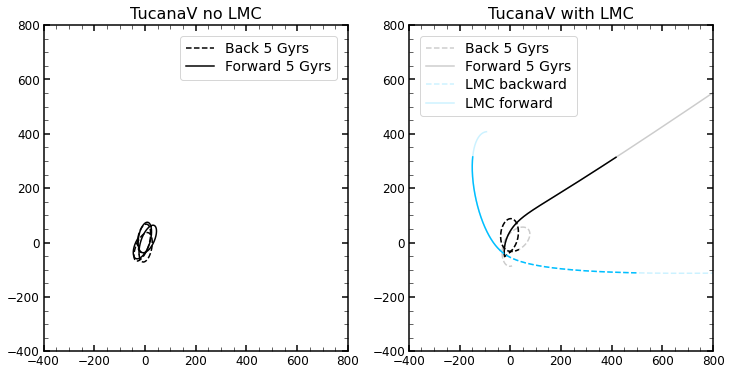

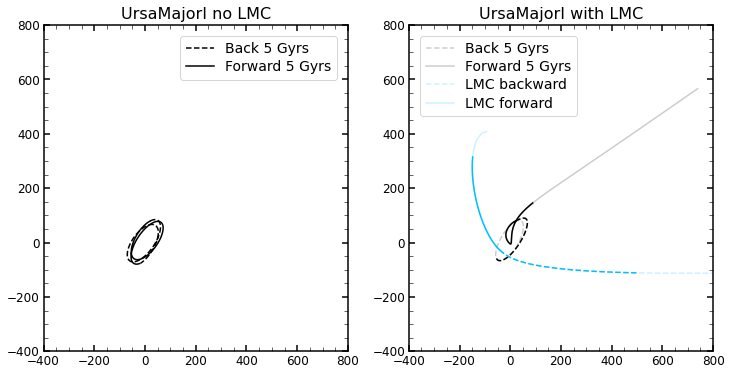

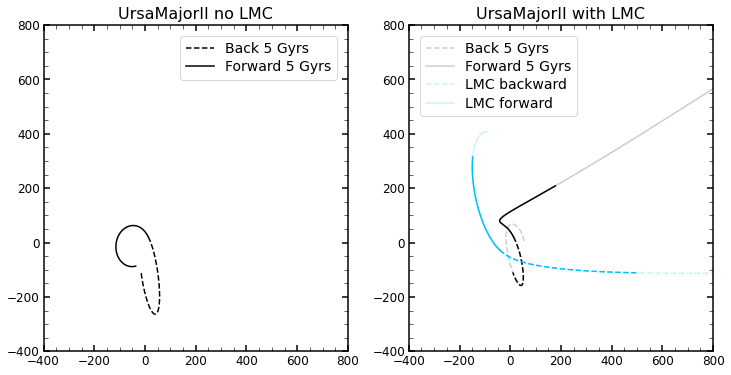

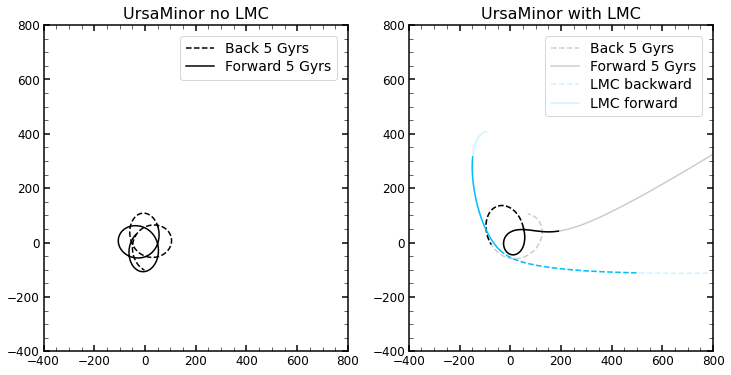

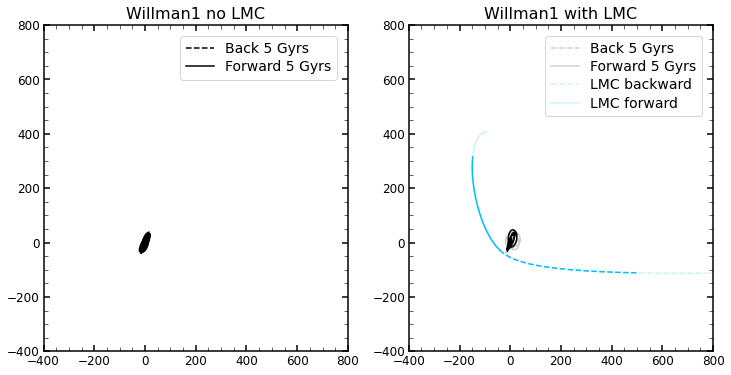

In [13]:
for name in names:
    if name != 'LMC':
        integrate_orbits_from_name(name)
        plt.show()

x and y ranges for plots below are -100 to 100.

**161 globular clusters**. Some of them are still bound, some of them are ejected.

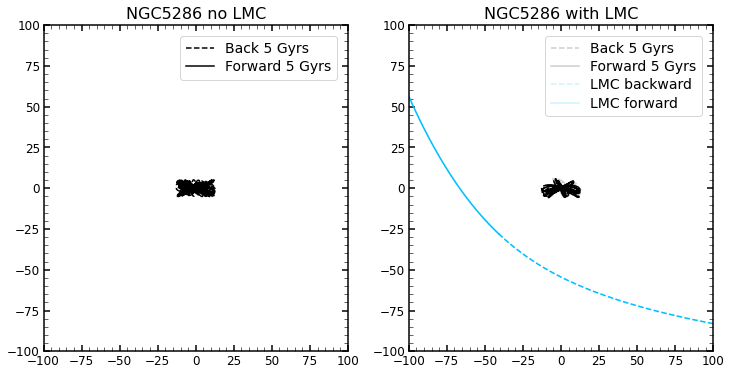

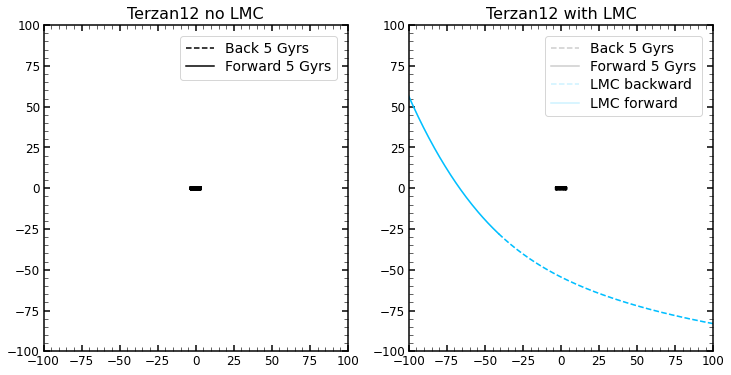

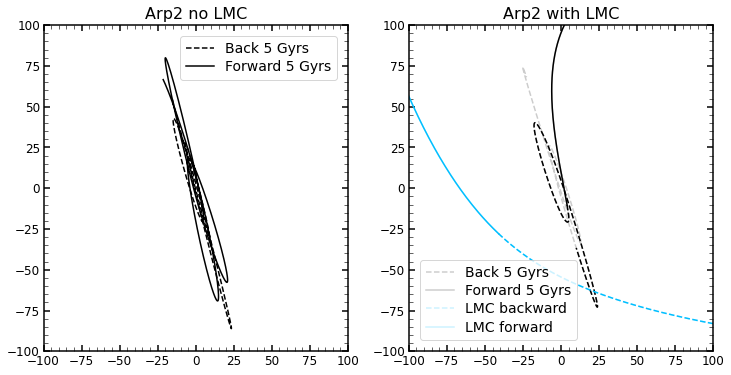

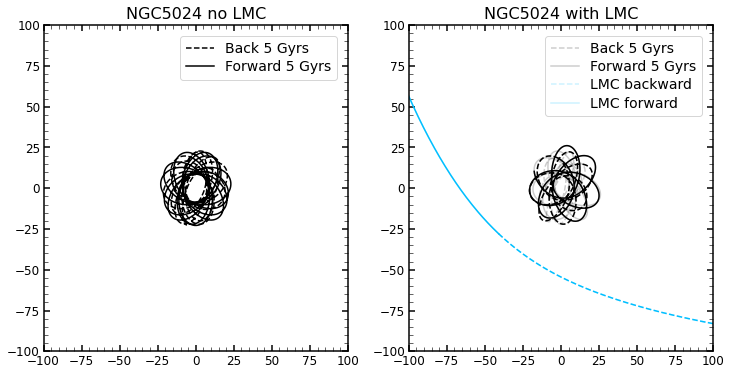

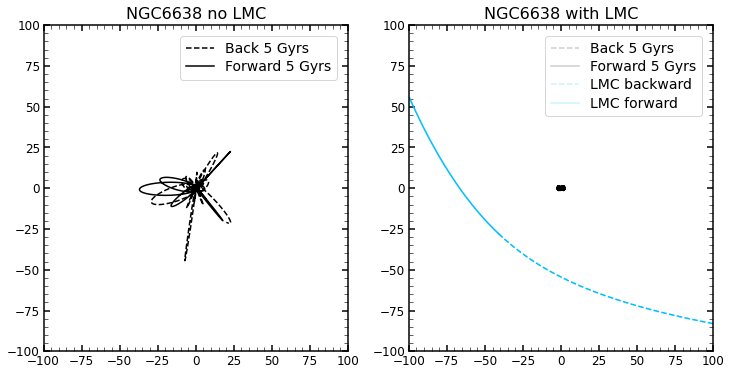

...

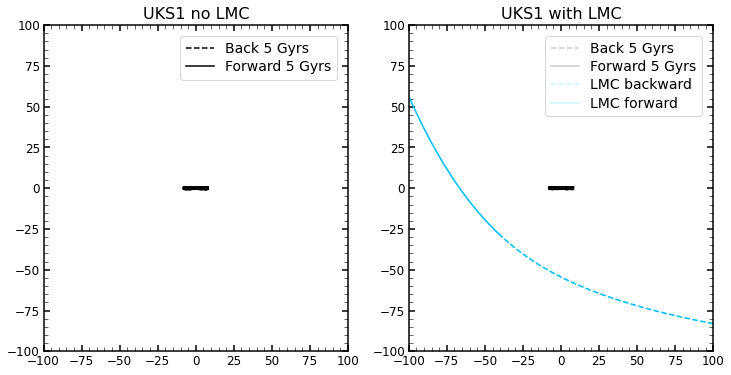

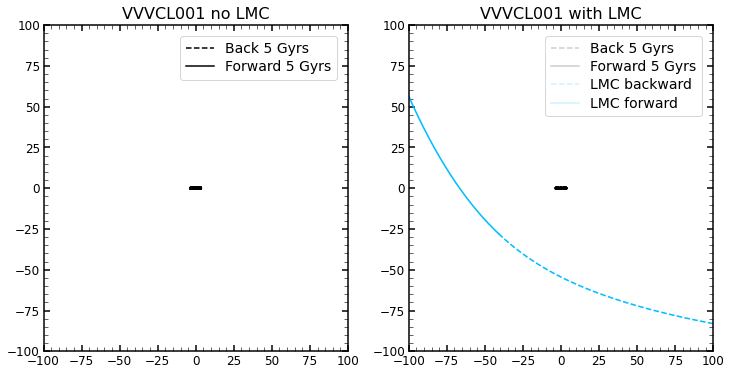

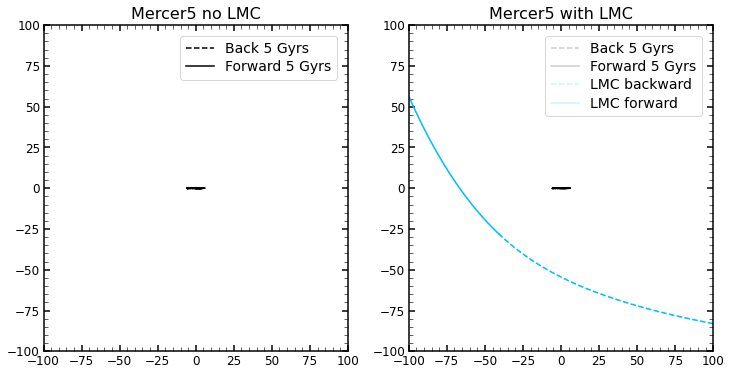

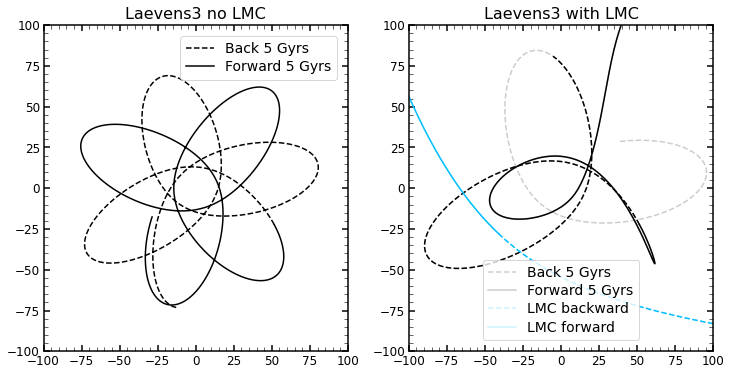

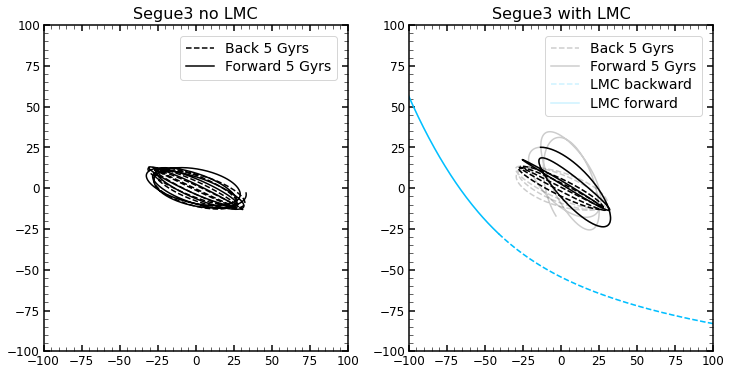

In [9]:
for name in cluster_names:
    integrate_orbits_from_name(name)
    plt.show()

## Now we remove Non-inertial frame force
Although theoretically this term should be included.

In [9]:
def get_MWPotential2014_with_LMC2(timescale):
    """Return the total potential to be used in orbit integration.
    
    This function is just the code from the galpy documentation example, with
    the addition of ro and vo for flexibility when choosing different potentials.
    (The same link referenced in the header of this notebook)
    
    Parameter:
    ----------
    timescale : the time array as astropy Quantity.
    """
    # Define orbit
    o = Orbit.from_name('LMC')

    # Define dynamical friction force
    cdf = ChandrasekharDynamicalFrictionForce(GMs=10.**11.*units.Msun, rhm=5.*units.kpc, dens=MWPotential2014)

    # Integrate the LMC orbit
    o.integrate(timescale, MWPotential2014+cdf)

    # Set it as moving object potential
    lmcpot = HernquistPotential(amp=2*10.**11.*units.Msun, a=5.*units.kpc/(1.+np.sqrt(2.)))
    moving_lmcpot = MovingObjectPotential(o, pot=lmcpot)

    # Acceleration at origin
    loc_origin= 1e-4 # Small offset in R to avoid numerical issues
    ax = lambda t : evaluateRforces(moving_lmcpot, loc_origin, 0., phi=0., t=t, use_physical=False)
    ay = lambda t : evaluatephitorques(moving_lmcpot, loc_origin, 0., phi=0., t=t, use_physical=False) / loc_origin
    az = lambda t : evaluatezforces(moving_lmcpot, loc_origin, 0., phi=0., t=t, use_physical=False)

    # Use interpolation function to speed things up
    t_intunits= o.time(use_physical=False)[::-1] # need to reverse the order for interp
    ax4int = np.array([ax(t) for t in t_intunits])
    ax_int = lambda t : np.interp(t, t_intunits, ax4int)
    ay4int = np.array([ay(t) for t in t_intunits])
    ay_int = lambda t : np.interp(t, t_intunits, ay4int)
    az4int = np.array([az(t) for t in t_intunits])
    az_int = lambda t : np.interp(t, t_intunits, az4int)

    nip = NonInertialFrameForce(a0=[ax_int, ay_int, az_int])
    
    return MWPotential2014 + moving_lmcpot, o

In [10]:
potential_backward, orbit_lmc_backward = get_MWPotential2014_with_LMC2(timescale1)
potential_forward, orbit_lmc_forward = get_MWPotential2014_with_LMC2(timescale2)

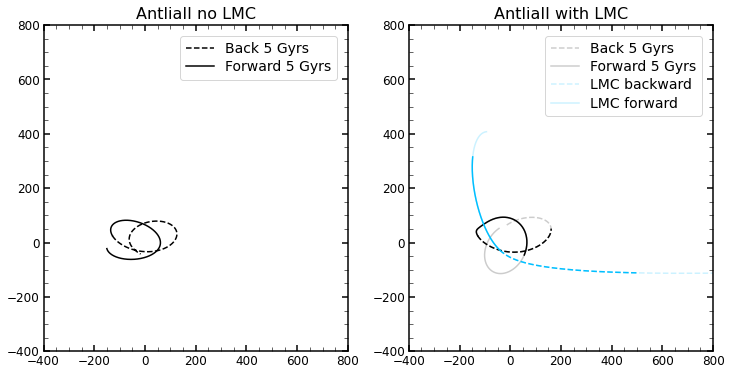

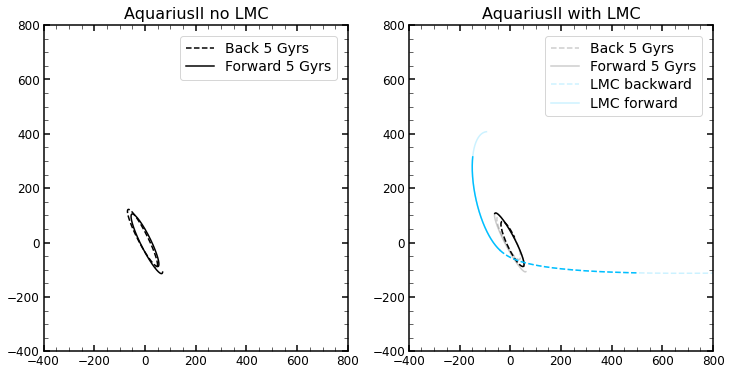

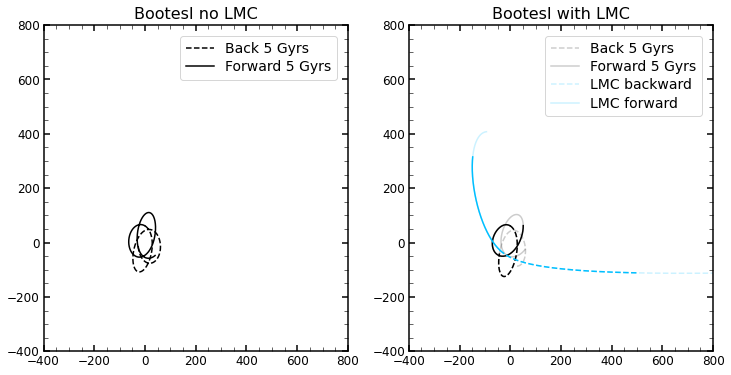

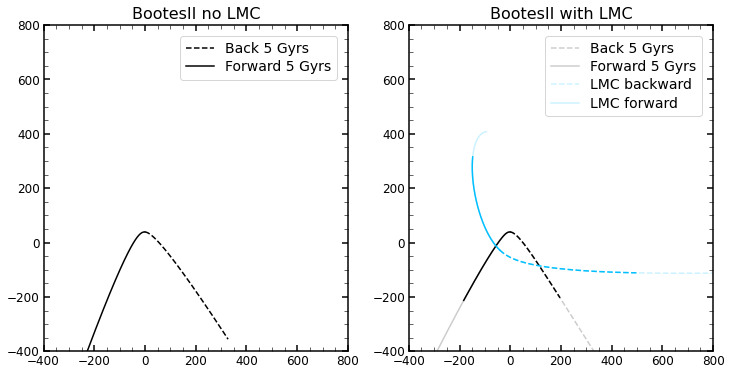

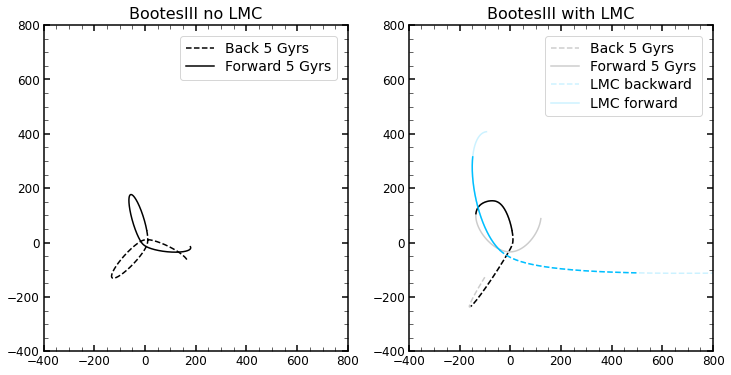

...

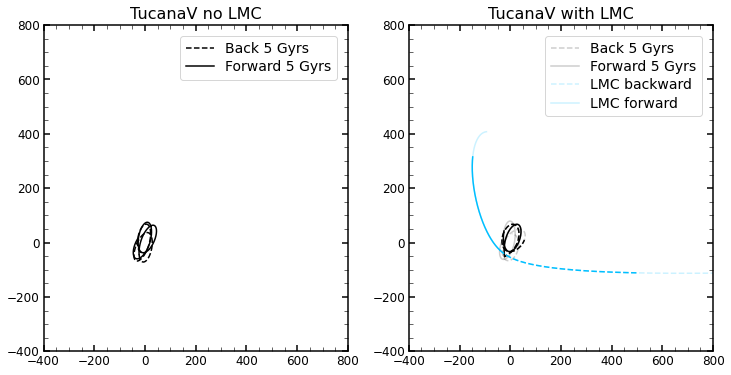

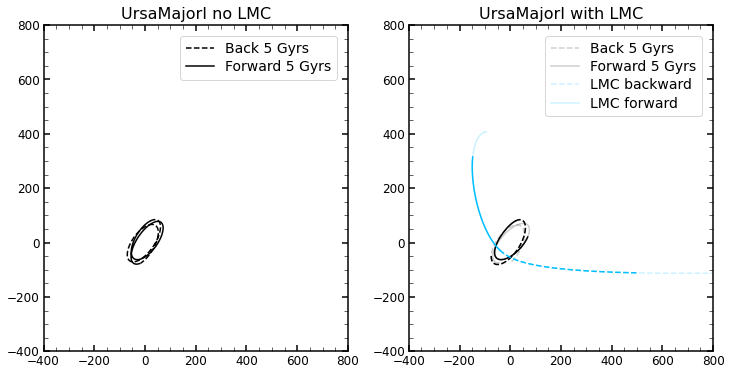

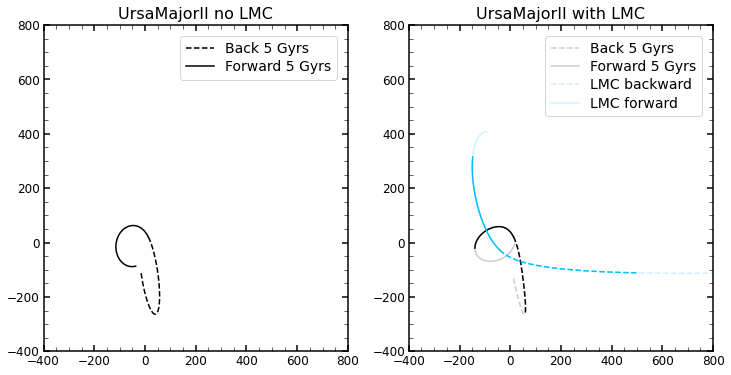

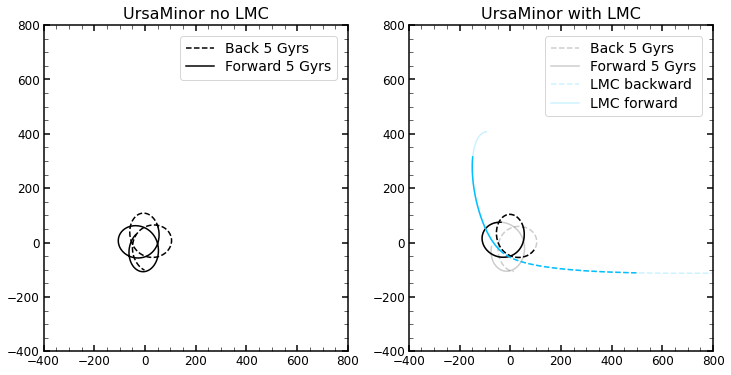

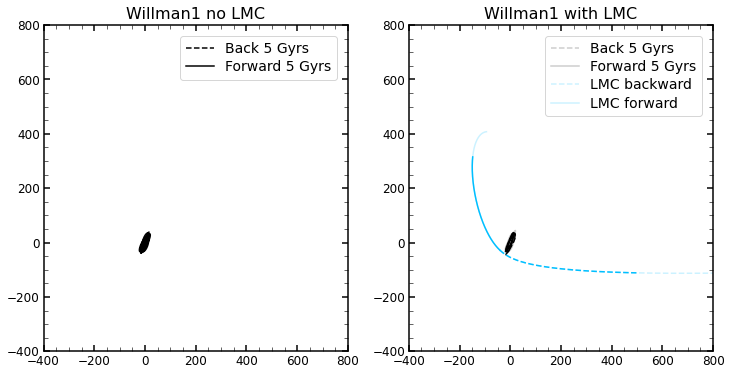

In [17]:
for name in names:
    if name != 'LMC':
        integrate_orbits_from_name(name)
        plt.show()

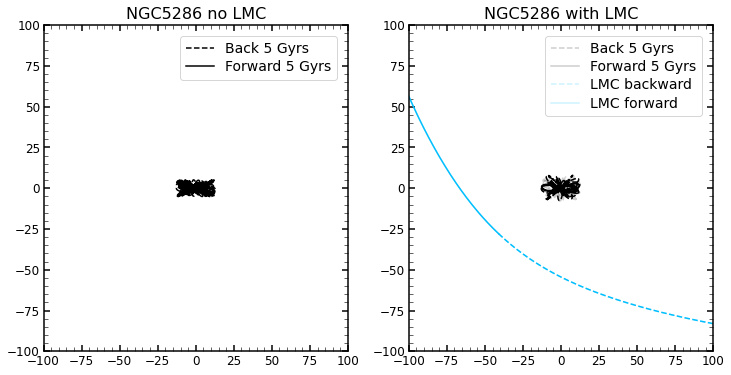

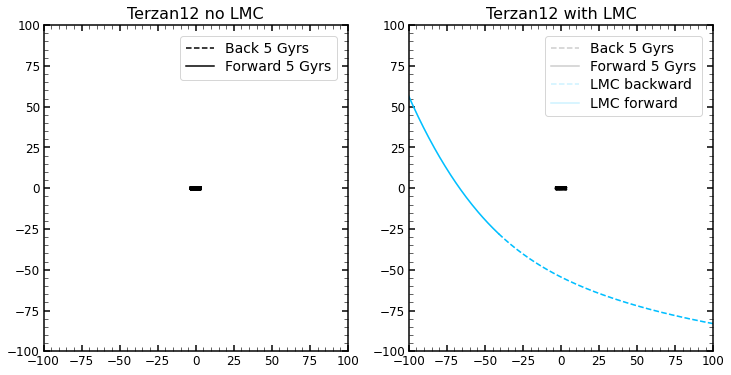

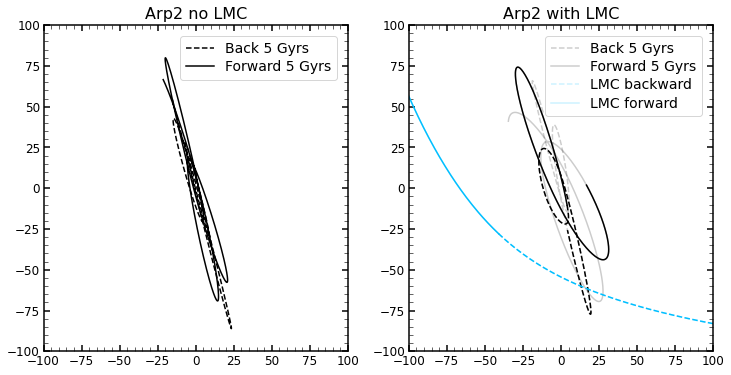

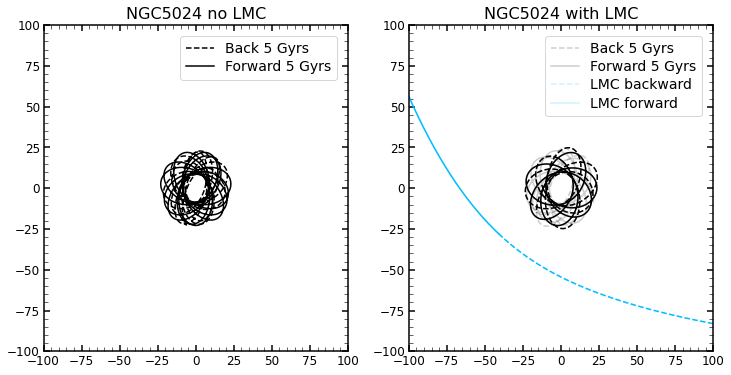

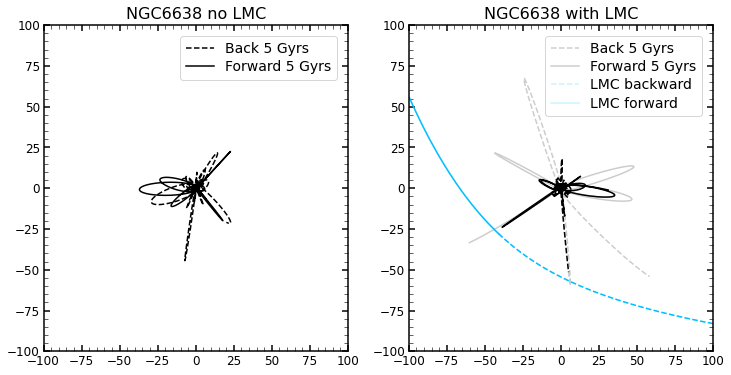

...

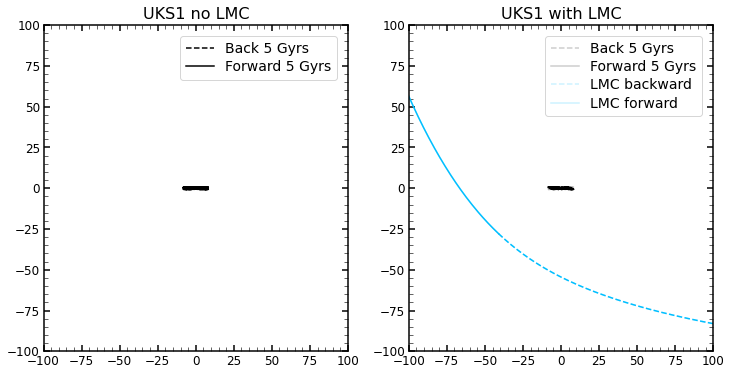

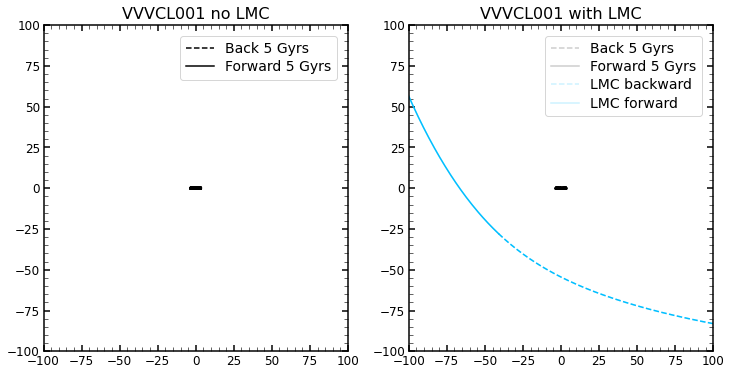

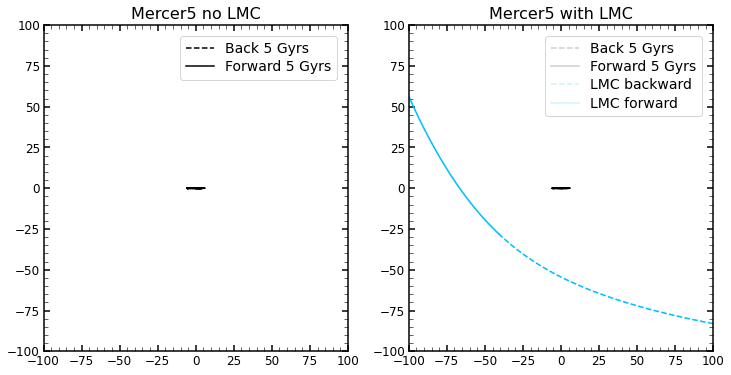

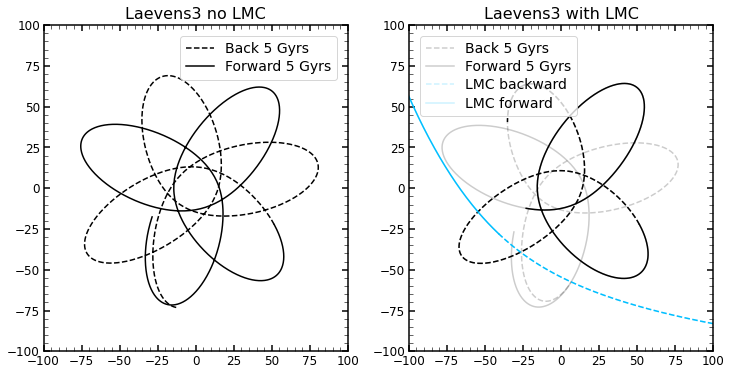

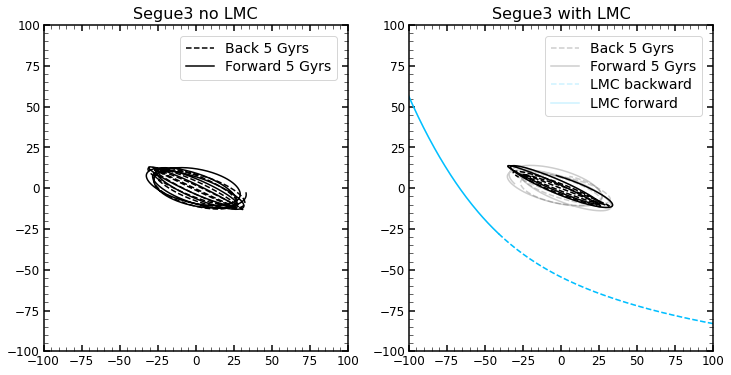

In [11]:
for name in cluster_names:
    integrate_orbits_from_name(name)
    plt.show()